In [173]:
#main libraries
import os
import re
import pickle
import numpy as np
import pandas as pd

#visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly 
import plotly.graph_objs as go
import plotly.io as pio
from plotly.subplots import make_subplots
import plotly.express as px
from plotly.offline import iplot, init_notebook_mode
import cufflinks as cf
import plotly.figure_factory as ff 
from plotly.offline import iplot
from plotly import tools

#machine learning libraries:
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.model_selection import StratifiedKFold, cross_validate, train_test_split, KFold, cross_val_score
from sklearn.preprocessing  import StandardScaler, LabelEncoder, MinMaxScaler, RobustScaler
from sklearn.ensemble import RandomForestRegressor, RandomForestRegressor
from xgboost import XGBRegressor, XGBClassifier
from sklearn.linear_model import LinearRegression, ElasticNet, Lasso,  BayesianRidge, LassoLarsIC
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.ensemble import (BaggingRegressor, AdaBoostRegressor,GradientBoostingRegressor, 
                              RandomForestRegressor,  GradientBoostingRegressor)
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_squared_log_error, r2_score
from mlxtend.regressor import StackingCVRegressor
import xgboost as xgb
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor, Pool, cv

import warnings
warnings.filterwarnings("ignore")        

# You can go offline on demand by using
cf.go_offline() 
# initiate notebook for offline plot
init_notebook_mode(connected=False)         


# set some display options:
plt.rcParams['figure.dpi'] = 100
colors = px.colors.qualitative.Prism
pio.templates.default = "plotly_white"

In [174]:
train = pd.read_csv('Train.csv')
test = pd.read_csv('Test.csv')
test_id = test.reset_index().drop('index',axis=1)['id']

#make a copy of the original data
train_df_orig = train.copy()
test_df_orig = test.copy()

#join all the data together
full_df = pd.concat([train.set_index('id'), test.set_index('id')]).reset_index(drop=True)
del full_df['price']

train = train.set_index('id').reset_index(drop=True)

In [175]:
train.head()

,date,street_id,build_tech,floor,area,rooms,balcon,metro_dist,g_lift,n_photos,...,kw5,kw6,kw7,kw8,kw9,kw10,kw11,kw12,kw13,price
0,2011-1,385,NaN,1,59,3,0,25.0,NaN,2,...,0,0,0,0,0,0,0,0,0,2489000
1,2011-1,247,NaN,5,53,2,1,15.0,1.0,2,...,0,0,0,0,0,0,0,0,0,1995000
2,2011-1,115,0.0,7,61,3,0,10.0,1.0,1,...,0,0,0,0,0,0,0,0,0,3993000
3,2011-1,491,1.0,5,61,3,1,30.0,NaN,0,...,0,0,0,0,0,0,0,0,0,5709000
4,2011-1,623,NaN,3,51,2,1,30.0,NaN,1,...,0,0,0,0,0,0,0,0,0,4374000


In [176]:
test.head()

,id,date,street_id,build_tech,floor,area,rooms,balcon,metro_dist,g_lift,...,kw4,kw5,kw6,kw7,kw8,kw9,kw10,kw11,kw12,kw13
0,100000,2012-3,553,1.0,9,35,1,1,25.0,1.0,...,0,0,0,0,0,0,0,0,0,0
1,100001,2012-3,21,0.0,1,41,2,0,10.0,1.0,...,0,0,0,0,0,0,0,0,0,0
2,100002,2012-3,203,1.0,2,52,2,1,15.0,1.0,...,0,0,0,0,0,0,0,0,0,0
3,100003,2012-3,332,NaN,7,36,1,0,30.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,100004,2012-3,581,NaN,6,33,1,0,0.0,NaN,...,0,0,0,0,0,0,0,0,0,0


In [177]:
rows, columns = full_df.shape
print('This data contains {} rows and {} columns splited into test/train datasets with ratio {}'.\
      format(rows, columns, round((test.shape[0]/train.shape[0])*100,2)))

This data contains 200000 rows and 23 columns splited into test/train datasets with ratio 100.0


In [178]:
print('We have {} columns : \n{}'.format(len(train.columns),train.columns.values))

We have 24 columns : 
['date' 'street_id' 'build_tech' 'floor' 'area' 'rooms' 'balcon'
 'metro_dist' 'g_lift' 'n_photos' 'kw1' 'kw2' 'kw3' 'kw4' 'kw5' 'kw6'
 'kw7' 'kw8' 'kw9' 'kw10' 'kw11' 'kw12' 'kw13' 'price']


In [179]:
train.info()
print('_ '*40)
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   date        100000 non-null  object 
 1   street_id   100000 non-null  int64  
 2   build_tech  70015 non-null   float64
 3   floor       100000 non-null  int64  
 4   area        100000 non-null  int64  
 5   rooms       100000 non-null  int64  
 6   balcon      100000 non-null  int64  
 7   metro_dist  94906 non-null   float64
 8   g_lift      69942 non-null   float64
 9   n_photos    100000 non-null  int64  
 10  kw1         100000 non-null  int64  
 11  kw2         100000 non-null  int64  
 12  kw3         100000 non-null  int64  
 13  kw4         100000 non-null  int64  
 14  kw5         100000 non-null  int64  
 15  kw6         100000 non-null  int64  
 16  kw7         100000 non-null  int64  
 17  kw8         100000 non-null  int64  
 18  kw9         100000 non-null  int64  
 19  kw1

In [180]:
corr = train.corr()
corr['price'].sort_values(ascending=False)[1:15].to_frame()\
.style.background_gradient(axis=1,cmap=sns.light_palette('green', as_cmap=True))

,price
area,0.685167
build_tech,0.389017
rooms,0.388511
balcon,0.309391
floor,0.206408
n_photos,0.184555
kw10,0.099034
kw13,0.046281
kw11,0.038859
kw12,0.033690


# Data Cleaning

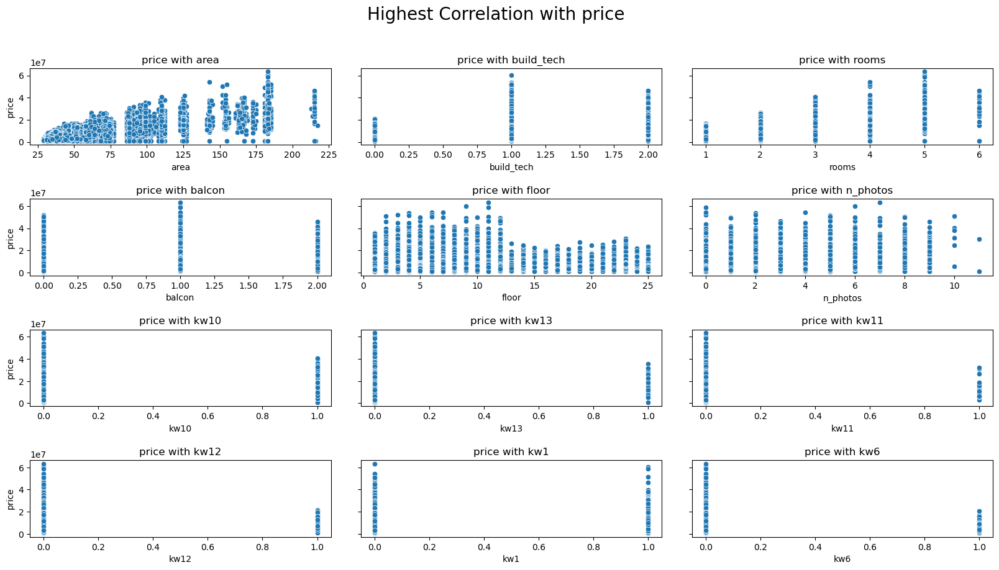

In [181]:
#Visualize columns have corr with SalePrice

high_corr = corr['price'].sort_values(ascending=False)[1:][:13].index.tolist()

fig, axes = plt.subplots(4,3, figsize=(20, 10), sharey=True);
plt.subplots_adjust(hspace = 0.7, wspace=0.1)
fig.suptitle('Highest Correlation with price', fontsize=20);

for i,col in zip(range(12),high_corr):
    sns.scatterplot(y=train['price'], x=train[col], ax=axes[i//3][i%3])
    axes[i//3][i%3].set_title('price with '+col)

In [182]:
drop_index = train[((train['area']>100) & (train['price']<1e7))|
                   ((train['price']>0.999e6) & (train['price']<1.01e6))].index

In [183]:
len(drop_index)

4199

In [184]:
temp = pd.DataFrame()
temp['price'] = train['price']
temp['Log price'] = np.log1p(train['price'])

temp.iplot(kind='hist',
           subplots=True,
           fill=True,
           subplot_titles=True,
           title='Sales Distribution')

In [185]:
Y_train = train['price']
del train['price']

#Converting the saleprice with Logarithms to overcome the high skewness and the outliers
Y_train = np.log1p(Y_train) 

full_df = pd.concat([train.iloc[:,0:], test.iloc[:,1:]])
ntrain = len(train)
ntest = len(test)

In [186]:
#null percentage for each column

null_df = round(100*(full_df.isnull().sum().sort_values(ascending=False)/len(full_df.index)),2)\
                    .to_frame().rename(columns={0:'Null values percentage'})[:15]
null_df

,Null values percentage
g_lift,30.09
build_tech,30.07
metro_dist,5.04
kw13,0.00
kw1,0.00
street_id,0.00
floor,0.00
area,0.00
rooms,0.00
balcon,0.00


In [187]:
#Pie plot for the percentage values

null_df.reset_index().iplot(kind='pie',
                            labels='index',
                            title='Null values percentage',
                            textinfo='label+text+percent',
                            values='Null values percentage')

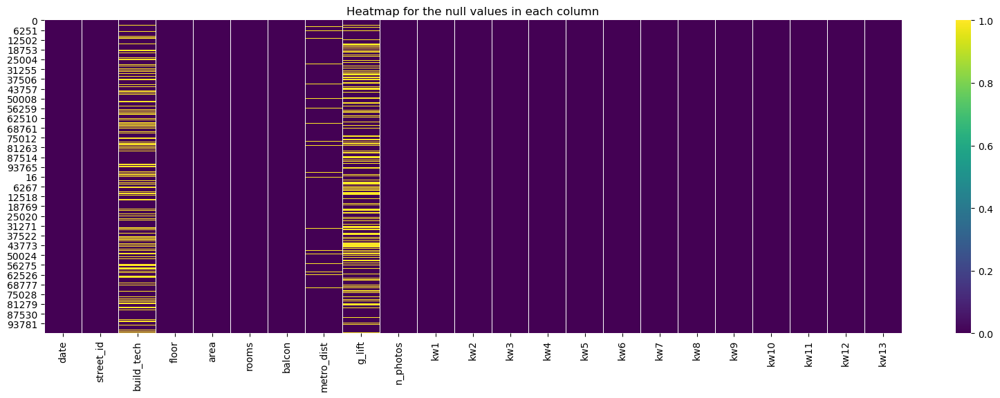

In [188]:
#Heatmap for the null values

plt.figure(figsize=(20,6))
plt.title('Heatmap for the null values in each column')
sns.heatmap(full_df.isnull(),cmap='viridis');

In [189]:
full_df['metro_dist'].fillna(full_df['metro_dist'].median(), inplace=True)
full_df['g_lift'].fillna(full_df['g_lift'].median(), inplace=True)
full_df['build_tech'].fillna(full_df['build_tech'].median(), inplace=True)

In [190]:
full_df['metro_dist'] = full_df['metro_dist'].astype(np.int64)
full_df['g_lift'] = full_df['g_lift'].astype(np.int64)
full_df['build_tech'] = full_df['build_tech'].astype(np.int64)
full_df['area'] = full_df['area'].astype(np.float64)

In [191]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 200000 entries, 0 to 99999
Data columns (total 23 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   date        200000 non-null  object 
 1   street_id   200000 non-null  int64  
 2   build_tech  200000 non-null  int64  
 3   floor       200000 non-null  int64  
 4   area        200000 non-null  float64
 5   rooms       200000 non-null  int64  
 6   balcon      200000 non-null  int64  
 7   metro_dist  200000 non-null  int64  
 8   g_lift      200000 non-null  int64  
 9   n_photos    200000 non-null  int64  
 10  kw1         200000 non-null  int64  
 11  kw2         200000 non-null  int64  
 12  kw3         200000 non-null  int64  
 13  kw4         200000 non-null  int64  
 14  kw5         200000 non-null  int64  
 15  kw6         200000 non-null  int64  
 16  kw7         200000 non-null  int64  
 17  kw8         200000 non-null  int64  
 18  kw9         200000 non-null  int64  
 19  kw1

In [192]:
print('Columns      Unique values count\n')
for col in full_df.columns:
    print(col,'-'*(30-len(col)),'>',len(full_df[col].unique()))

Columns      Unique values count

date -------------------------- > 36
street_id --------------------- > 672
build_tech -------------------- > 3
floor ------------------------- > 25
area -------------------------- > 115
rooms ------------------------- > 6
balcon ------------------------ > 3
metro_dist -------------------- > 7
g_lift ------------------------ > 2
n_photos ---------------------- > 13
kw1 --------------------------- > 2
kw2 --------------------------- > 2
kw3 --------------------------- > 2
kw4 --------------------------- > 2
kw5 --------------------------- > 2
kw6 --------------------------- > 2
kw7 --------------------------- > 2
kw8 --------------------------- > 2
kw9 --------------------------- > 2
kw10 -------------------------- > 2
kw11 -------------------------- > 2
kw12 -------------------------- > 2
kw13 -------------------------- > 2


<AxesSubplot:xlabel='area', ylabel='Density'>

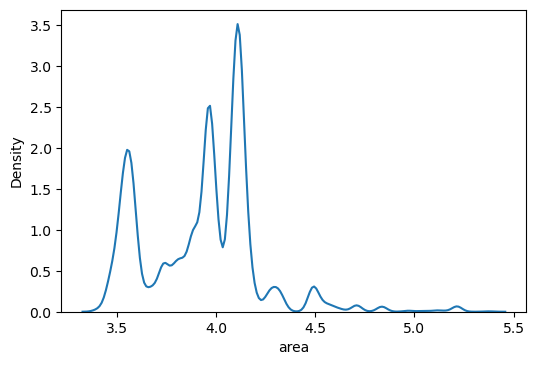

In [201]:
sns.kdeplot(np.log1p(full_df['area']))

In [224]:
df = df = full_df.copy()

# df = df.drop(['date'], axis = 1)
df['date'] = df['date'].astype(str)
lbl = LabelEncoder() 
full_df['date'] = lbl.fit_transform(full_df['date'])

dumm = pd.get_dummies(df['date'], prefix = 'date', dtype=int)
df = pd.concat([df,dumm], axis=1)
    
df.drop(['date'], axis=1, inplace=True)

df['area'] = np.log1p(df['area'])
train_set = df[:ntrain].reset_index().drop('index',axis=1)
test_set = df[ntrain:].reset_index().drop('index',axis=1)

#dropping the outliers
train_set = train_set.drop(drop_index)

In [225]:
train_set.head()

,street_id,build_tech,floor,area,rooms,balcon,metro_dist,g_lift,n_photos,kw1,...,date_2013-11,date_2013-12,date_2013-2,date_2013-3,date_2013-4,date_2013-5,date_2013-6,date_2013-7,date_2013-8,date_2013-9
0,385,0,1,4.094345,3,0,25,0,2,0,...,0,0,0,0,0,0,0,0,0,0
1,247,0,5,3.988984,2,1,15,1,2,0,...,0,0,0,0,0,0,0,0,0,0
2,115,0,7,4.127134,3,0,10,1,1,0,...,0,0,0,0,0,0,0,0,0,0
3,491,1,5,4.127134,3,1,30,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,623,0,3,3.951244,2,1,30,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
Y_train = Y_train.drop(drop_index)

# Models

In [227]:
# define models to test:

base_models = {"Elastic Net":make_pipeline(RobustScaler(),                    #Elastic Net model(Regularized model)
                                            ElasticNet(alpha=0.0005,
                                                       l1_ratio=0.9)),
               "Lasso" : make_pipeline(RobustScaler(), Lasso(alpha =0.0005,   #Lasso model(Regularized model)
                                                             random_state=1)),
               "Random Forest": RandomForestRegressor(n_estimators=300),      #Random Forest model
               "XGBoost": XGBRegressor(),                                     #XGBoost model
               "LGBM" : LGBMRegressor(objective='regression',num_leaves=5,
                                      learning_rate=0.05, n_estimators=720,
                                      max_bin = 55, bagging_fraction = 0.8,
                                      bagging_freq = 5, feature_fraction = 0.2319,
                                      feature_fraction_seed=9, bagging_seed=9,
                                      min_data_in_leaf =6, min_sum_hessian_in_leaf = 11),                                              
               "Gradient Boosting":make_pipeline(StandardScaler(),
                                                 GradientBoostingRegressor(n_estimators=3000, #GradientBoosting model
                                                                           learning_rate=0.005,     
                                                                           max_depth=4, max_features='sqrt',
                                                                           min_samples_leaf=15, min_samples_split=10, 
                                                                           loss='huber', random_state =5))}

In [228]:
# Preprocessing, fitting, making predictions and scoring for every model:
models_data = {'R^2':{'Training':{},'Testing':{}},
               'Adjusted R^2':{'Training':{},'Testing':{}},
               'MAE':{'Training':{},'Testing':{}},
               'MSE':{'Training':{},'Testing':{}},
               'RMSE':{'Training':{},'Testing':{}}}

X_train, X_test, y_train, y_test = train_test_split(train_set, Y_train, test_size=0.2, random_state=42)
p = train_set.shape[1]
train_n = X_train.shape[0]
test_n = X_test.shape[0]

for name in base_models:
    #fitting the model
    model = base_models[name].fit(X_train, y_train)
    #make predictions with train and test datasets
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    #calculate the R-Squared for training and testing
    r2_train,r2_test = model.score(X_train, y_train), model.score(X_test, y_test)
    models_data['R^2']['Training'][name], models_data['R^2']['Testing'][name] = r2_train, r2_test
            
    #calculate the Adjusted R-Squared for training and testing
    adj_train, adj_test = (1-(1-r2_train)*(train_n-1)/(train_n-p-1)) ,(1-(1-r2_test)*(train_n-1)/(train_n-p-1))
    models_data['Adjusted R^2']['Training'][name], models_data['Adjusted R^2']['Testing'][name] = adj_train, adj_test
               
    #calculate the Mean absolute error for training and testing
    mae_train, mae_test = mean_absolute_error(y_train, y_pred_train), mean_squared_error(y_test, y_pred_test)         
    models_data['MAE']['Training'][name], models_data['MAE']['Testing'][name] = mae_train, mae_test
               
    #calculate Mean square error for training and testing
    mse_train, mse_test = mean_squared_error(y_train, y_pred_train), mean_squared_error(y_test, y_pred_test)
    models_data['MSE']['Training'][name], models_data['MSE']['Testing'][name] = mse_train, mse_test

    #calculate Root mean error for training and testing    
    rmse_train, rmse_test = np.sqrt(mse_train), np.sqrt(mse_test)
    models_data['RMSE']['Training'][name], models_data['RMSE']['Testing'][name] = rmse_train, rmse_test
    
    print('\n========================={}========================='.format(name))
    print('**********Training**********************Testing********')
    print('R^2    : ',r2_train,' '*(25-len(str(r2_train))),r2_test) 
    print('Adj R^2: ',adj_train,' '*(25-len(str(adj_train))),adj_test) 
    print('MAE    : ',mae_train,' '*(25-len(str(mae_train))),mae_test) 
    print('MSE    : ',mse_train,' '*(25-len(str(mse_train))),mse_test) 
    print('RMSE   : ',rmse_train,' '*(25-len(str(rmse_train))),rmse_test)


=========================Elastic Net=========================
**********Training**********************Testing********
R^2    :  0.5654569956114566         0.5532175667992326
Adj R^2:  0.5651278866385452         0.5528791880744099
MAE    :  0.3248785087841757         0.16897228203426584
MSE    :  0.16659620738988495        0.16897228203426584
RMSE   :  0.40816198670366766        0.41106238216877233

=========================Lasso=========================
**********Training**********************Testing********
R^2    :  0.5653953345654421         0.5531874101071399
Adj R^2:  0.5650661788924265         0.5528490085426032
MAE    :  0.3249039626770745         0.16898368723890878
MSE    :  0.1666198471592656         0.16898368723890878
RMSE   :  0.4081909444846438         0.41107625477386645

=========================Random Forest=========================
**********Training**********************Testing********
R^2    :  0.9562419299229136         0.6745834933260415
Adj R^2:  0.9562087889602

In [229]:
R_2 = pd.DataFrame(models_data['R^2']).sort_values(by='Testing',ascending=False)
Adjusted_R_2 = pd.DataFrame(models_data['Adjusted R^2']).sort_values(by='Testing',ascending=False)
MAE = pd.DataFrame(models_data['MAE']).sort_values(by='Testing',ascending=True)
MSE = pd.DataFrame(models_data['MSE']).sort_values(by='Testing',ascending=True)
RMSE = pd.DataFrame(models_data['RMSE']).sort_values(by='Testing',ascending=True)

In [230]:
#order the results by testing values

px.line(data_frame=MAE.reset_index(),
        x='index',y=['Training','Testing'],
        title='Mean absolute error for training and testing')

In [222]:
model = XGBRegressor()
model.fit(train_set, Y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=12, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [223]:
submission = pd.DataFrame()
submission['id'] = test['id']
submission['price'] = np.expm1(model.predict(test_set))
submission.to_csv('submission.csv', index=False)

# Stacking

In [236]:
base_models = (RandomForestRegressor(n_estimators=1000),
               XGBRegressor())
meta_model = CatBoostRegressor(**params)

In [238]:
kfold = KFold(n_splits=5)

In [239]:
stack = StackingCVRegressor(regressors=base_models,
                            meta_regressor=meta_model, 
                            use_features_in_secondary=True,
                            store_train_meta_features=True,
                            shuffle=False,cv=kfold,
                            random_state=1)

In [240]:
stack.fit(train_set,Y_train)

StackingCVRegressor(cv=KFold(n_splits=5, random_state=None, shuffle=False),
                    meta_regressor=<catboost.core.CatBoostRegressor object at 0x000002620DA84D00>,
                    random_state=1,
                    regressors=(RandomForestRegressor(n_estimators=1000),
                                XGBRegressor(base_score=None, booster=None,
                                             colsample_bylevel=None,
                                             colsample_bynode=None,
                                             colsample_bytree=None, gamma=None,
                                             gpu_id=None,
                                             im...
                                             max_delta_step=None,
                                             max_depth=None,
                                             min_child_weight=None, missing=nan,
                                             monotone_constraints=None,
                                 

In [248]:
submission = pd.DataFrame()
submission['id'] = test['id']
submission['price'] = np.expm1(stack.predict(test_set.values))
submission.to_csv('submission.csv', index=False)

In [242]:
train_set.columns

Index(['street_id', 'build_tech', 'floor', 'area', 'rooms', 'balcon',
       'metro_dist', 'g_lift', 'n_photos', 'kw1', 'kw2', 'kw3', 'kw4', 'kw5',
       'kw6', 'kw7', 'kw8', 'kw9', 'kw10', 'kw11', 'kw12', 'kw13',
       'date_2011-1', 'date_2011-10', 'date_2011-11', 'date_2011-12',
       'date_2011-2', 'date_2011-3', 'date_2011-4', 'date_2011-5',
       'date_2011-6', 'date_2011-7', 'date_2011-8', 'date_2011-9',
       'date_2012-1', 'date_2012-10', 'date_2012-11', 'date_2012-12',
       'date_2012-2', 'date_2012-3', 'date_2012-4', 'date_2012-5',
       'date_2012-6', 'date_2012-7', 'date_2012-8', 'date_2012-9',
       'date_2013-1', 'date_2013-10', 'date_2013-11', 'date_2013-12',
       'date_2013-2', 'date_2013-3', 'date_2013-4', 'date_2013-5',
       'date_2013-6', 'date_2013-7', 'date_2013-8', 'date_2013-9'],
      dtype='object')

In [245]:
test_set.columns == train_set.columns

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True])

# CatBoost

In [231]:
categorical_features_indices = np.where(train_set.dtypes != np.float)[0]

In [249]:
params = {
    'iterations': 500,
    'learning_rate': 0.4999597368725945,
    'l2_leaf_reg': 2,
    'eval_metric': 'MAE',
    'random_seed': 42,
    'logging_level': 'Silent',
    'use_best_model': False
}

X_train, X_validation, y_train, y_validation = train_test_split(train_set, Y_train, train_size=0.75, shuffle=True, random_state=42)
train_pool = Pool(X_train, y_train, cat_features=categorical_features_indices)
validate_pool = Pool(X_validation, y_validation, cat_features=categorical_features_indices)

In [250]:
model = CatBoostRegressor(**params)
model.fit(train_pool, eval_set=validate_pool)



print('Simple model validation MAE: {:.4}'.format(
    np.mean(np.abs(y_validation - model.predict(X_validation)))
))
print('')

Simple model validation MAE: 0.09335



In [ ]:
model.fit(
    train_set, Y_train,
    cat_features=categorical_features_indices
)

In [212]:
submission = pd.DataFrame()
submission['id'] = test['id']
submission['price'] = np.expm1(model.predict(test_set))
submission.to_csv('submission.csv', index=False)

In [213]:
feature_importances = model.get_feature_importance()
feature_names = train_set.columns
for score, name in sorted(zip(feature_importances, feature_names), reverse=True):
    print('{}: {}'.format(name, score))

area: 44.62220047951393
street_id: 36.2735786316637
balcon: 5.134043202899266
rooms: 4.397924557197902
build_tech: 4.152655595896858
metro_dist: 2.5176556271276356
floor: 1.8311577926106026
n_photos: 0.5718368474237207
kw1: 0.2430955373517881
kw2: 0.1129369945488741
kw3: 0.07006090146708192
kw9: 0.024597344530219493
kw5: 0.019703865337413345
kw8: 0.008276565069251986
kw10: 0.007082118708930409
kw7: 0.005022628723664392
kw4: 0.0038688738731667317
kw6: 0.0032032216886693347
kw11: 0.001099214367278303
kw13: 0.0
kw12: 0.0
g_lift: 0.0


Лучший результат получен catboost без преобразования date